# Project 5
## Team 6: Maya Flores, Selina Spry, Emma Williams

In [83]:
import numpy as np
import matplotlib.pyplot as plt
from commpy.filters import rcosfilter, rrcosfilter
import scipy.interpolate
import math
import scipy.signal

In [84]:
# Define plotting parameters
pxoffset = 1
pyoffset = 1
pwidth = 7
pheight = 4
smalltxtsize = 12
medtxtsize = 14
bigtxtsize = 18

plt.rc('font', size=smalltxtsize)          # controls default text sizes
plt.rc('axes', titlesize=smalltxtsize)     # fontsize of the axes title
plt.rc('axes', labelsize=medtxtsize)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=smalltxtsize)    # fontsize of the tick labels
plt.rc('ytick', labelsize=smalltxtsize)    # fontsize of the tick labels
plt.rc('legend', fontsize=smalltxtsize)    # legend fontsize
plt.rc('figure', titlesize=bigtxtsize)  # fontsize of the figure title

In [85]:
# Equivalent implementation of MATLAB's interp function
def interpolate_1d_vector(vector, factor):
    """
    Interpolate, i.e. upsample, a given 1D vector by a specific interpolation factor.
    :param vector: 1D data vector
    :param factor: factor for interpolation (must be integer)
    :return: interpolated 1D vector by a given factor
    """
    x = np.arange(np.size(vector))
    y = vector
    f = scipy.interpolate.interp1d(x, y, kind='cubic')

    x_extended_by_factor = np.linspace(x[0], x[-1], np.size(x) * factor)
    y_interpolated = np.zeros(np.size(x_extended_by_factor))

    i = 0
    for x in x_extended_by_factor:
        y_interpolated[i] = f(x)
        i += 1

    return y_interpolated

In [86]:
# Define simulation parameters to be used in Section 2 and Section 3
N_bits = 10000 # Total number of bits for entire transmission
f_c = 2        # Carrier frequency
f_s = 10       # Sampling frequency
f_d = 1        # Digital system sampling frequency
beta = 0.5     # Roll-off factor for raised cosine filter
sigma_n = 0.25 # Noise standard deviation

In [87]:
# Generate random binary data stream
bin_data = np.around(np.random.random((N_bits,)))

# Assignment of binary sets to amplitude values
bin1 = bin_data # Binary data stream for 2-ASK
bin2 = bin_data.reshape((2,int(N_bits/2))) # Binary data stream for 4-ASK
ampl1 = np.zeros((N_bits,))
ampl2 = np.zeros((int(N_bits/2),))

# Define amplitude mapping for 2-ASK
ampl1[bin1 == 1] = 1
ampl1[bin1 == 0] = -1

# Define amplitude mapping for 4-ASK
ampl2[(bin2[0,:] == 0) & (bin2[1,:] == 0) ] = -3
ampl2[(bin2[0,:] == 1) & (bin2[1,:] == 0) ]  = -1
ampl2[(bin2[0,:] == 0) & (bin2[1,:] == 1) ] = 1
ampl2[(bin2[0,:] == 1) & (bin2[1,:] == 1) ] = 3

In [88]:
# Apply raised cosine pulse shaping filter
ps_rcos = rcosfilter(61,0.5,1,10)[1] # Define raised cosine filter for pulse shaping

# Prepare upsampled and pulse shaped 2-ASK transmission
d_upsample = np.zeros((len(ampl1)*10,))
d_upsample[::10] = ampl1#impulse train

# Prepare upsampled and pulse shaped 4-ASK transmission
d_upsample1 = np.zeros((len(ampl2)*10,))
d_upsample1[::10] = ampl2#impulse train

# Pulse shape both 2-ASK and 4-ASK data streams
ampl1_rcos = np.convolve(ps_rcos,d_upsample,'same')
ampl2_rcos = np.convolve(ps_rcos,d_upsample1,'same')

In [89]:
# Modulate both 2-ASK and 4-ASK pulse shaped signals to carrier frequency f_c
tx_ask2_wavefm = ampl1_rcos*np.cos(2*np.pi*f_c*np.arange(0,((len(ampl1_rcos)-1)*(1/f_s)),(1/f_s)))
tx_ask4_wavefm = ampl2_rcos*np.cos(2*np.pi*f_c*np.arange(0,((len(ampl2_rcos))*(1/f_s)),(1/f_s)))

In [90]:
# Introduce Passband Additive White Gaussian Noise (AWGN) to transmission (both I and Q components)

# AWGN for passband 2-ASK signal
noise_temp = (sigma_n/math.sqrt(2))*np.random.standard_normal(len(tx_ask2_wavefm),) # 
noise2 = noise_temp*np.cos(2*np.pi*f_c*np.arange(0,((len(ampl1_rcos)-1)*(1/f_s)),(1/f_s))) + noise_temp*np.sin(2*np.pi*f_c*np.arange(0,((len(ampl1_rcos)-1)*(1/f_s)),(1/f_s)))

# AWGN for passband 4-ASK signal
noise_temp1 = (sigma_n/math.sqrt(2))*np.random.standard_normal(len(tx_ask4_wavefm),)
noise4 = noise_temp1*np.cos(2*np.pi*f_c*np.arange(0,((len(ampl2_rcos))*(1/f_s)),(1/f_s))) + noise_temp1*np.sin(2*np.pi*f_c*np.arange(0,((len(ampl2_rcos))*(1/f_s)),(1/f_s))) 

# Noise added, generating passband signals to be intercepted at receiver
rx_ask2_wavefm = tx_ask2_wavefm + noise2
rx_ask4_wavefm = tx_ask4_wavefm + noise4

In [91]:
# Demodulate 2-ASK and 4-ASK waveforms using coherent detection

# Multiple by cosine function with carrier frequency f_c to get I component
ampl1_rawi = rx_ask2_wavefm*np.cos(2*np.pi*f_c*np.arange(0,((len(ampl1_rcos)-1)*(1/f_s)),(1/f_s)))
ampl2_rawi = rx_ask4_wavefm*np.cos(2*np.pi*f_c*np.arange(0,((len(ampl2_rcos))*(1/f_s)),(1/f_s)))

# Multiple by sine function with carrier frequency f_c to get Q component
ampl1_rawq = rx_ask2_wavefm*np.sin(2*np.pi*f_c*np.arange(0,((len(ampl1_rcos)-1)*(1/f_s)),(1/f_s)))
ampl2_rawq = rx_ask4_wavefm*np.sin(2*np.pi*f_c*np.arange(0,((len(ampl2_rcos))*(1/f_s)),(1/f_s)))

# Design lowpass filter and employ it to remove double frequency terms
filt_coeffs = scipy.signal.firwin(61,0.25, window = "hamming", pass_zero = 'lowpass')
ampl1_filti = np.convolve(filt_coeffs,ampl1_rawi,'same')
ampl2_filti = np.convolve(filt_coeffs,ampl2_rawi,'same')
ampl1_filtq = np.convolve(filt_coeffs,ampl1_rawq,'same')
ampl2_filtq = np.convolve(filt_coeffs,ampl2_rawq,'same')

In [92]:
# Sample correct amplitude values from filtered I and Q components
start_samp = int(np.floor((len(rcosfilter(61,0.5,1,10)[1])) + (len(filt_coeffs)-1 )/2)) # Calculate group delay

ampl1_finali = 2*ampl1_filti[start_samp:int(start_samp + (len(ampl1)-1)*(f_s/f_d)):int(f_s/f_d)]
ampl2_finali = 2*ampl2_filti[start_samp:int(start_samp + (len(ampl2)-1)*(f_s/f_d)):int(f_s/f_d)]
ampl1_finalq = 2*ampl1_filtq[start_samp:int(start_samp + (len(ampl1)-1)*(f_s/f_d)):int(f_s/f_d)]
ampl2_finalq = 2.*ampl2_filtq[start_samp:int(start_samp + (len(ampl2)-1)*(f_s/f_d)):int(f_s/f_d)]

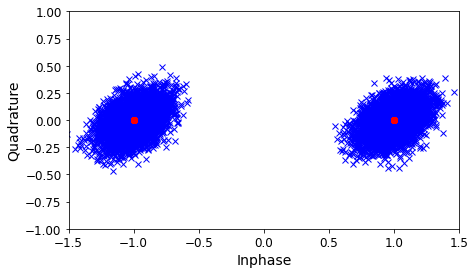

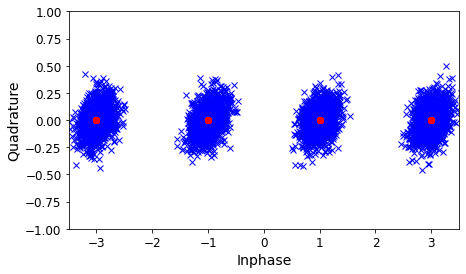

In [93]:
# Generater scatter plots of outputs
plt.figure(figsize=(pwidth,pheight))

plt.plot(ampl1_finali,ampl1_finalq,'bx',ampl1,np.zeros((len(ampl1),)),'ro')
plt.xlim([-1.5,1.5])
plt.ylim([-1,1])
plt.xlabel('Inphase')
plt.ylabel('Quadrature')
plt.savefig('scat2ask.eps', format='eps')
plt.show()

plt.figure(figsize=(pwidth,pheight))
plt.plot(ampl2_finali,ampl2_finalq,'bx',ampl2,np.zeros((len(ampl2),)),'ro')
plt.xlim([-3.5,3.5])
plt.ylim([-1,1])
plt.xlabel('Inphase')
plt.ylabel('Quadrature')
plt.savefig('scat4ask.eps', format='eps')
plt.show()

### Question 1:
<br> Plot the scatter plot of a square 4-QAM transmission prior to transmission across a channel and after sampling at the receiver. Use the sample code from Section 2
as well as the example code for this section from the Jupyter Notebook to get started.

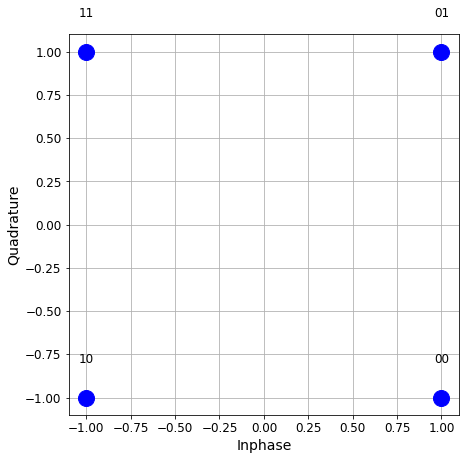

In [94]:
# Example code for mapping two binary digits to a square QAM symbol

# bits per symbol
M = 2  

# Define mapping between binary and I/Q domain
mapping_table = {
    (1,0) : -1-1j,
    (1,1) : -1+1j,
    (0,0) :  1-1j,
    (0,1) :  1+1j
}

# Define corresponding demapping table
demapping_table = {v : k for k, v in mapping_table.items()}

# Plot signal constellation
plt.figure(figsize=(pwidth,pwidth))
for b1 in [0, 1]:
    for b0 in [0, 1]:
        B = (b1, b0)
        Q = mapping_table[B]
        plt.plot(Q.real, Q.imag, 'bo', markersize=16)
        plt.text(Q.real, Q.imag+0.2, "".join(str(x) for x in B), ha='center')
plt.xlabel('Inphase')
plt.ylabel('Quadrature')
plt.grid()
plt.savefig('sigconstell4qam.eps', format='eps')
plt.show()

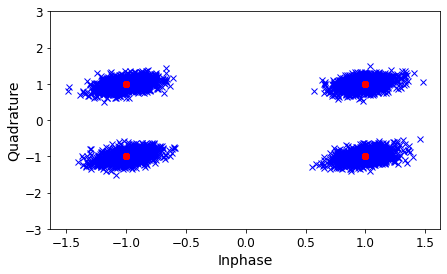

In [95]:
# Generate binary data stream
bin1 = bin_data.reshape((2,int(N_bits/2))) # Binary data stream for 4-ASK

ampl1i = np.zeros((int(N_bits/2),))
ampl1q = np.zeros((int(N_bits/2),))

# Define mapping between binary and I/Q domain
ampl1i[(bin1[0,:] == 0)] = 1
ampl1i[(bin1[0,:] == 1)] = -1
ampl1q[(bin1[1,:] == 0)] = -1
ampl1q[(bin1[1,:] == 1)] = 1

# Prepare upsampled and pulse shaped 4-QAM transmission
d_upsample1i = np.zeros((len(ampl1i)*10,))
d_upsample1i[::10] = ampl1i #impulse train
d_upsample1q = np.zeros((len(ampl1q)*10,))
d_upsample1q[::10] = ampl1q #impulse train

# Apply raised cosine pulse shaping filter
ps_rcos = rcosfilter(61,0.5,1,10)[1] # Define raised cosine filter for pulse shaping

# Pulse shape 4QAM data streams
ampl1i_rcos = np.convolve(ps_rcos,d_upsample1i,'same')
ampl1q_rcos = np.convolve(ps_rcos,d_upsample1q,'same')

# Modulate 4-QAM pulse shaped signals to carrier frequency f_c
tx_QAM4_wavefm_i = ampl1i_rcos*np.cos(2*np.pi*f_c*np.arange(0,((len(ampl1i_rcos))*(1/f_s)),(1/f_s)))
tx_QAM4_wavefm_q = -ampl1q_rcos*np.sin(2*np.pi*f_c*np.arange(0,((len(ampl1q_rcos))*(1/f_s)),(1/f_s)))
tx_QAM4_wavefm = tx_QAM4_wavefm_i + tx_QAM4_wavefm_q

# AWGN for passband 4-QAM signal
noise_temp1 = (sigma_n/math.sqrt(2))*np.random.standard_normal(len(tx_QAM4_wavefm),)
noise4 = noise_temp1*np.cos(2*np.pi*f_c*np.arange(0,((len(ampl1i_rcos))*(1/f_s)),(1/f_s))) + noise_temp1*np.sin(2*np.pi*f_c*np.arange(0,((len(ampl1q_rcos))*(1/f_s)),(1/f_s))) 

# Noise added, generating passband signals to be intercepted at receiver
rx_QAM4_wavefm = tx_QAM4_wavefm + noise4

# Demodulate 4-QAM waveform using coherent detection
# Multiple by cosine function with carrier frequency f_c to get I component
QAM4_rawi = rx_QAM4_wavefm*np.cos(2*np.pi*f_c*np.arange(0,((len(ampl1i_rcos))*(1/f_s)),(1/f_s)))

# Multiple by sine function with carrier frequency f_c to get Q component
QAM4_rawq = rx_QAM4_wavefm*np.sin(2*np.pi*f_c*np.arange(0,((len(ampl1q_rcos))*(1/f_s)),(1/f_s)))

# Design lowpass filter and employ it to remove double frequency terms
filt_coeffs = scipy.signal.firwin(61,0.25, window = "hamming", pass_zero = 'lowpass')
QAM_filti = np.convolve(filt_coeffs,QAM4_rawi,'same')
QAM_filtq = np.convolve(filt_coeffs,QAM4_rawq,'same')

# Sample correct amplitude values from filtered I and Q components
start_samp = int(np.floor((len(rcosfilter(61,0.5,1,10)[1])) + (len(filt_coeffs)-1 )/2)) # Calculate group delay

QAM_finali = 2*QAM_filti[start_samp:int(start_samp + (len(ampl1i)-1)*(f_s/f_d)):int(f_s/f_d)]
QAM_finalq = 2*QAM_filtq[start_samp:int(start_samp + (len(ampl1q)-1)*(f_s/f_d)):int(f_s/f_d)]

# Generater scatter plots of outputs
plt.figure(figsize=(pwidth,pheight))
plt.plot(QAM_finali,QAM_finalq,'bx',ampl1i,ampl1q,'ro')
# plt.xlim([-3.5,3.5])
plt.ylim([-3,3])
plt.xlabel('Inphase')
plt.ylabel('Quadrature')
plt.savefig('scat4qam.eps', format='eps')
plt.show()

### Question 2:
<br> Plot the scatter plot of a π/4-offset QPSK transmission prior to transmission across a channel and after sampling at the receiver. Use the sample code from Section 2 as well as the example code for this section from the Jupyter Notebook to get started.

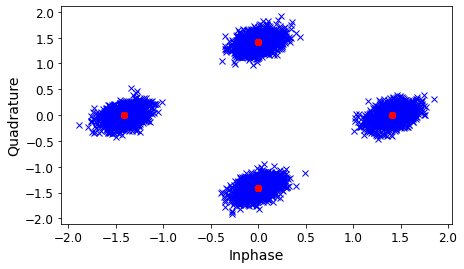

In [96]:
# Generate binary data stream
bin2 = bin_data.reshape((2,int(N_bits/2))) # Binary data stream for 4-ASK

ampl2 = np.zeros((int(N_bits/2),))+ np.zeros((int(N_bits/2),))*1j

ampl2[(bin2[0,:] == 0) & (bin2[1,:] == 0)] = -(np.sqrt(2))+0*1j
ampl2[(bin2[0,:] == 1) & (bin2[1,:] == 0)] = 0-(np.sqrt(2))*1j
ampl2[(bin2[0,:] == 0) & (bin2[1,:] == 1)] = 0+(np.sqrt(2))*1j
ampl2[(bin2[0,:] == 1) & (bin2[1,:] == 1)] = (np.sqrt(2))+0*1j

# Prepare upsampled and pulse shaped 4-QAM transmission
d_upsample2i = np.zeros((len(ampl2.real)*10,))
d_upsample2i[::10] = ampl2.real #impulse train
d_upsample2q = np.zeros((len(ampl2.imag)*10,))
d_upsample2q[::10] = ampl2.imag #impulse train

# Apply raised cosine pulse shaping filter
ps_rcos = rcosfilter(61,0.5,1,10)[1] # Define raised cosine filter for pulse shaping

# Pulse shape 4QAM data streams
ampl2i_rcos = np.convolve(ps_rcos,d_upsample2i,'same')
ampl2q_rcos = np.convolve(ps_rcos,d_upsample2q,'same')

# Modulate 4-QAM pulse shaped signals to carrier frequency f_c
tx_QAM4pi_wavefm_i = ampl2i_rcos*np.cos(2*np.pi*f_c*np.arange(0,((len(ampl2i_rcos))*(1/f_s)),(1/f_s)))
tx_QAM4pi_wavefm_q = -ampl2q_rcos*np.sin(2*np.pi*f_c*np.arange(0,((len(ampl2q_rcos))*(1/f_s)),(1/f_s)))
tx_QAM4pi_wavefm = tx_QAM4pi_wavefm_i + tx_QAM4pi_wavefm_q

# AWGN for passband 4-QAM signal
noise_temp2 = (sigma_n/math.sqrt(2))*np.random.standard_normal(len(tx_QAM4pi_wavefm),)
noise4pi = noise_temp2*np.cos(2*np.pi*f_c*np.arange(0,((len(ampl2i_rcos))*(1/f_s)),(1/f_s))) + noise_temp2*np.sin(2*np.pi*f_c*np.arange(0,((len(ampl2q_rcos))*(1/f_s)),(1/f_s))) 

# Noise added, generating passband signals to be intercepted at receiver
rx_QAM4pi_wavefm = tx_QAM4pi_wavefm + noise4pi

# Demodulate 4-QAM waveform using coherent detection
# Multiple by cosine function with carrier frequency f_c to get I component
QAM4pi_rawi = rx_QAM4pi_wavefm*np.cos(2*np.pi*f_c*np.arange(0,((len(ampl2i_rcos))*(1/f_s)),(1/f_s)))

# Multiple by sine function with carrier frequency f_c to get Q component
QAM4pi_rawq = rx_QAM4pi_wavefm*np.sin(2*np.pi*f_c*np.arange(0,((len(ampl2q_rcos))*(1/f_s)),(1/f_s)))

# Design lowpass filter and employ it to remove double frequency terms
filt_coeffs = scipy.signal.firwin(61,0.25, window = "hamming", pass_zero = 'lowpass')
QAM4pi_filti = np.convolve(filt_coeffs,QAM4pi_rawi,'same')
QAM4pi_filtq = np.convolve(filt_coeffs,QAM4pi_rawq,'same')

# Sample correct amplitude values from filtered I and Q components
start_samp = int(np.floor((len(rcosfilter(61,0.5,1,10)[1])) + (len(filt_coeffs)-1 )/2)) # Calculate group delay

QAM4pi_finali = 2*QAM4pi_filti[start_samp:int(start_samp + (len(ampl2.real)-1)*(f_s/f_d)):int(f_s/f_d)]
QAM4pi_finalq = 2*QAM4pi_filtq[start_samp:int(start_samp + (len(ampl2.imag)-1)*(f_s/f_d)):int(f_s/f_d)]

# Generater scatter plots of outputs
plt.figure(figsize=(pwidth,pheight))
plt.plot(QAM4pi_finali,QAM4pi_finalq,'bx',ampl2.real,ampl2.imag,'ro')
# plt.xlim([-5,5])
# plt.ylim([-5,5])
plt.xlabel('Inphase')
plt.ylabel('Quadrature')
plt.savefig('scat4qam.eps', format='eps')
plt.show()

### Question 3:
<br> Plot the scatter plot of a square 16-QAM transmission prior to transmission across a channel and after sampling at the receiver. Use the sample code from Section 2 as well as the example code for this section from the Jupyter Notebook to get started.

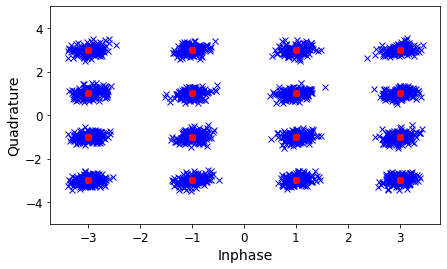

In [97]:
# Generate binary data stream
bin3 = bin_data.reshape((4,int(N_bits/4))) # Binary data stream for 16QAM

ampl3i = np.zeros((int(N_bits/4),))
ampl3q = np.zeros((int(N_bits/4),))

# Define mapping between binary and I/Q domain
ampl3i[(bin3[0,:] == 0) & (bin3[1,:] == 0)] = -3
ampl3i[(bin3[0,:] == 1) & (bin3[1,:] == 0)] = -1
ampl3i[(bin3[0,:] == 0) & (bin3[1,:] == 1)] = 1
ampl3i[(bin3[0,:] == 1) & (bin3[1,:] == 1)] = 3
ampl3q[(bin3[2,:] == 0) & (bin3[3,:] == 0)] = -3
ampl3q[(bin3[2,:] == 1) & (bin3[3,:] == 0)] = -1
ampl3q[(bin3[2,:] == 0) & (bin3[3,:] == 1)] = 1
ampl3q[(bin3[2,:] == 1) & (bin3[3,:] == 1)] = 3

# Prepare upsampled and pulse shaped 16QAM transmission
d_upsample3i = np.zeros((len(ampl3i)*10,))
d_upsample3i[::10] = ampl3i #impulse train
d_upsample3q = np.zeros((len(ampl3q)*10,))
d_upsample3q[::10] = ampl3q #impulse train

# Apply raised cosine pulse shaping filter
ps_rcos = rcosfilter(61,0.5,1,10)[1] # Define raised cosine filter for pulse shaping

# Pulse shape 16QAM data streams
ampl3i_rcos = np.convolve(ps_rcos,d_upsample3i,'same')
ampl3q_rcos = np.convolve(ps_rcos,d_upsample3q,'same')

# Modulate 4-QAM pulse shaped signals to carrier frequency f_c
tx_QAM16_wavefm_i = ampl3i_rcos*np.cos(2*np.pi*f_c*np.arange(0,((len(ampl3i_rcos))*(1/f_s)),(1/f_s)))
tx_QAM16_wavefm_q = -ampl3q_rcos*np.sin(2*np.pi*f_c*np.arange(0,((len(ampl3q_rcos))*(1/f_s)),(1/f_s)))
tx_QAM16_wavefm = tx_QAM16_wavefm_i + tx_QAM16_wavefm_q

# AWGN for passband 4-QAM signal
noise_temp3 = (sigma_n/math.sqrt(2))*np.random.standard_normal(len(tx_QAM16_wavefm),)
noise16 = noise_temp3*np.cos(2*np.pi*f_c*np.arange(0,((len(ampl3i_rcos))*(1/f_s)),(1/f_s))) + noise_temp3*np.sin(2*np.pi*f_c*np.arange(0,((len(ampl3q_rcos))*(1/f_s)),(1/f_s))) 

# Noise added, generating passband signals to be intercepted at receiver
rx_QAM16_wavefm = tx_QAM16_wavefm + noise16

# Demodulate 4-QAM waveform using coherent detection
# Multiple by cosine function with carrier frequency f_c to get I component
QAM16_rawi = rx_QAM16_wavefm*np.cos(2*np.pi*f_c*np.arange(0,((len(ampl3i_rcos))*(1/f_s)),(1/f_s)))

# Multiple by sine function with carrier frequency f_c to get Q component
QAM16_rawq = rx_QAM16_wavefm*np.sin(2*np.pi*f_c*np.arange(0,((len(ampl3q_rcos))*(1/f_s)),(1/f_s)))

# Design lowpass filter and employ it to remove double frequency terms
filt_coeffs = scipy.signal.firwin(61,0.25, window = "hamming", pass_zero = 'lowpass')
QAM16_filti = np.convolve(filt_coeffs,QAM16_rawi,'same')
QAM16_filtq = np.convolve(filt_coeffs,QAM16_rawq,'same')

# Sample correct amplitude values from filtered I and Q components
start_samp = int(np.floor((len(rcosfilter(61,0.5,1,10)[1])) + (len(filt_coeffs)-1 )/2)) # Calculate group delay

QAM16_finali = 2*QAM16_filti[start_samp:int(start_samp + (len(ampl3i)-1)*(f_s/f_d)):int(f_s/f_d)]
QAM16_finalq = 2*QAM16_filtq[start_samp:int(start_samp + (len(ampl3q)-1)*(f_s/f_d)):int(f_s/f_d)]


# Generater scatter plots of outputs
plt.figure(figsize=(pwidth,pheight))
plt.plot(QAM16_finali,QAM16_finalq,'bx',ampl3i,ampl3q,'ro')
# plt.xlim([-3.5,3.5])
plt.ylim([-5,5])
plt.xlabel('Inphase')
plt.ylabel('Quadrature')
plt.savefig('scat4qam.eps', format='eps')
plt.show()

### Question 4:
<br> Modify the OFDM Python code such that π/4-offset QPSK symbols are used instead of 4-QAM symbols per subcarrier. Generate the scatter plot of the received corrupted subcarrier symbols.

In [98]:
# bits per symbol
M = 2  

# Define mapping between binary and I/Q domain
mapping_table1 = {
    (1,0) : 0-1j,
    (1,1) : -1+0j,
    (0,0) :  1-0j,
    (0,1) :  0+1j
}

# Define corresponding demapping table
demapping_table1 = {v : k for k, v in mapping_table1.items()}

In [99]:
# Define the specifications of the OFDM transceiver
dataCarriers = 52 # Number of data subcarriers
SNR = 8 # Signal-to-Noise Ratio (change this value to see the effect on received signal and constellation)
total_ofdm_symbols = dataCarriers*M  # Total number of bits transmitted per OFDM symbol

# Generate random bits that will form one OFDM symbol
bits = np.random.binomial(n=1, p=0.5, size=(total_ofdm_symbols, ))

# Reshape binary data such that M bits for each of the subcarriers 
def SP(bits):
    return bits.reshape((dataCarriers, M))
bits_SP = SP(bits)

# Map bits to symbols (in this case, these are being mapped to QAM)
def Mapping(bits):
    return np.array([mapping_table1[tuple(b)] for b in bits])
QAM = Mapping(bits_SP)

In [100]:
# Generate one OFDM symbol using IDFT

# Setup OFDM symbol by initializing with zero vector
def OFDM_symbol(QAM_payload):
    symbol = np.zeros(dataCarriers, dtype=complex) # the overall K subcarriers
    symbol[:] = QAM_payload  # allocate the pilot subcarriers
    return symbol
OFDM_data = OFDM_symbol(QAM)

# Apply IDFT to create one OFDM symbol
def IDFT(OFDM_data):
    return np.fft.ifft(OFDM_data)
OFDM_time = IDFT(OFDM_data)

In [101]:
# Transmit one OFDM symbol across noisy channel
def channel(signal):
    signal_power = np.mean(abs(signal**2))
    sigma2 = signal_power * 10**(-SNR/10)  # calculate noise power based on signal power and SNR
    
    # Print out received signal power and noise power
    print ("RX Signal power: %.4f. Noise power: %.4f" % (signal_power, sigma2))
    
    # Generate complex noise with given variance
    noise = np.sqrt(sigma2/2) * (np.random.randn(*signal.shape)+1j*np.random.randn(*signal.shape))
    return signal + noise

# Pass transmitted OFDM symbol through channel and produce received OFDM symbol   
OFDM_TX = OFDM_time
OFDM_RX = channel(OFDM_TX)

RX Signal power: 0.0192. Noise power: 0.0030


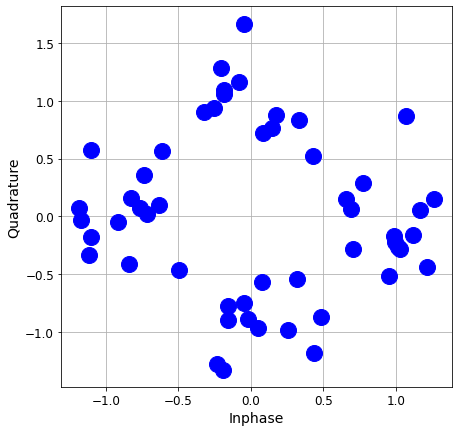

In [102]:
# Apply DFT to received OFDM symbol to recover symbols for each subcarrier
def DFT(OFDM_RX):
    return np.fft.fft(OFDM_RX)
OFDM_demod = DFT(OFDM_RX)

# Extract subcarrier symbols that formed one OFDM symbol
def get_payload(OFDM_demod):
    return OFDM_demod[:]
QAM_est = get_payload(OFDM_demod)

# Generate scatter plot of each QAM symbol from every subcarrier that formed the single OFDM symbol
plt.figure(figsize=(pwidth,pwidth))
plt.plot(QAM_est.real, QAM_est.imag, 'bo', markersize=16)
plt.xlabel('Inphase')
plt.ylabel('Quadrature')
plt.grid()
plt.savefig('ofdm4qamunmapped.eps', format='eps')
plt.show()

### Question 5:
<br> Instead of just transmitting and receiving just one OFDM symbol, modify the sample code such that it can transmit/receive L OFDM symbols (L > 1). Demonstrate functionality via a cumulative scatter plot of the received corrupted subcarrier symbols across all OFDM symbols.

RX Signal power: 0.0192. Noise power: 0.0030
RX Signal power: 0.0192. Noise power: 0.0030
RX Signal power: 0.0192. Noise power: 0.0030
RX Signal power: 0.0192. Noise power: 0.0030
RX Signal power: 0.0192. Noise power: 0.0030
RX Signal power: 0.0192. Noise power: 0.0030
RX Signal power: 0.0192. Noise power: 0.0030
RX Signal power: 0.0192. Noise power: 0.0030
RX Signal power: 0.0192. Noise power: 0.0030
RX Signal power: 0.0192. Noise power: 0.0030
RX Signal power: 0.0192. Noise power: 0.0030
RX Signal power: 0.0192. Noise power: 0.0030
RX Signal power: 0.0192. Noise power: 0.0030
RX Signal power: 0.0192. Noise power: 0.0030
RX Signal power: 0.0192. Noise power: 0.0030
RX Signal power: 0.0192. Noise power: 0.0030
RX Signal power: 0.0192. Noise power: 0.0030
RX Signal power: 0.0192. Noise power: 0.0030
RX Signal power: 0.0192. Noise power: 0.0030
RX Signal power: 0.0192. Noise power: 0.0030
RX Signal power: 0.0192. Noise power: 0.0030
RX Signal power: 0.0192. Noise power: 0.0030
RX Signal 

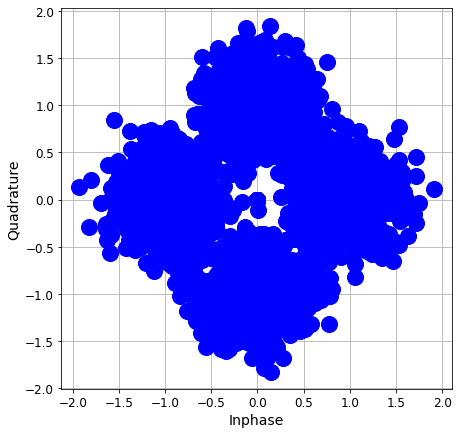

In [103]:
def L_OFDM_symbols(L):

    # Define the specifications of the OFDM transceiver
    M = 2
    dataCarriers = 52 # Number of data subcarriers
    total_ofdm_symbols = dataCarriers*M  # Total number of bits transmitted per OFDM symbol

    QAM_est1 = np.zeros(dataCarriers)
    for n in range(L):
        # Generate random bits that will form one OFDM symbol
        bits = np.random.binomial(n=1, p=0.5, size=(total_ofdm_symbols, ))

        # Reshape binary data such that M bits for each of the subcarriers 
        bits_SP = SP(bits)

        # Map bits to symbols (in this case, these are being mapped to QAM)
        QAM = Mapping(bits_SP)

        # Generate one OFDM symbol using IDFT
        # Setup OFDM symbol by initializing with zero vector
        OFDM_data = OFDM_symbol(QAM)

        # Apply IDFT to create one OFDM symbol
        OFDM_time = IDFT(OFDM_data)

        # Pass transmitted OFDM symbol through channel and produce received OFDM symbol 
        OFDM_TX = OFDM_time
        OFDM_RX = channel(OFDM_TX)

        # Apply DFT to received OFDM symbol to recover symbols for each subcarrier
        OFDM_demod = DFT(OFDM_RX)

        # Extract subcarrier symbols that formed one OFDM symbol
        QAM_est1 = np.append(QAM_est1,get_payload(OFDM_demod))

    return QAM_est1
       
var = L_OFDM_symbols(dataCarriers)

# Generate scatter plot of each QAM symbol from every subcarrier that formed the single OFDM symbol
plt.figure(figsize=(pwidth,pwidth))
plt.plot(var.real, var.imag, 'bo', markersize=16)
plt.xlabel('Inphase')
plt.ylabel('Quadrature')
plt.grid()
plt.savefig('ofdm4qamunmapped.eps', format='eps')
plt.show()

### Question 6:
<br> For single carrier transmission of 4-ASK symbols, calculate the RMS EVM values given 4-ASK, 4-QAM, and π/4-offset QPSK reference signal constellations. Show that the RMS EVM value is lower for 4-ASK relative to when either a 4-QAM or a π/4-offset QPSK reference signal constellation is used. Repeat experiment when the transmission consists of 4-QAM and π/4-offset QPSK symbols.

In [104]:
# bits per symbol
M = 2  

# Define mapping between binary and I/Q domain
mapping_table2 = {
    (1,0) : -1,
    (1,1) :  3,
    (0,0) : -3,
    (0,1) :  1
}

# Define corresponding demapping table
demapping_table2 = {v : k for k, v in mapping_table2.items()}

In [105]:
# Use nearest neighbor approach to map received subcarrier symbols to closest possible symbol representation
def Demapping(QAM, demapping_table):
    # array of possible constellation points
    constellation = np.array([x for x in demapping_table.keys()])
    
    # calculate distance of each RX point to each possible point
    dists = abs(QAM.reshape((-1,1)) - constellation.reshape((1,-1)))
    
    # for each element in QAM, choose the index in constellation 
    # that belongs to the nearest constellation point
    const_index = dists.argmin(axis=1)
    
    # get back the real constellation point
    hardDecision = constellation[const_index]
    
    # transform the constellation point into the bit groups
    return np.vstack([demapping_table[C] for C in hardDecision]), hardDecision

# Perform mapping to closest possible symbol representation for pi/4-QPSK Tx
PS_est0, hardDecision0 = Demapping(QAM_est, demapping_table)      #4-QAM
PS_est1, hardDecision1 = Demapping(QAM_est, demapping_table1)     #pi/4-QPSK
PS_est2, hardDecision2 = Demapping(QAM_est, demapping_table2)     #4-ASK

In [106]:
# Define the specifications of the OFDM transceiver
M = 2
dataCarriers = 52 # Number of data subcarriers
total_ofdm_symbols = dataCarriers*M  # Total number of bits transmitted per OFDM symbol

QAM_est2 = np.zeros(dataCarriers)

# Generate random bits that will form one OFDM symbol
bits = np.random.binomial(n=1, p=0.5, size=(total_ofdm_symbols, ))

# Reshape binary data such that M bits for each of the subcarriers 
bits_SP = SP(bits)

# Map bits to symbols (in this case, these are being mapped to QAM)
def Mapping(bits):
    return np.array([mapping_table[tuple(b)] for b in bits])
QAM = Mapping(bits_SP)

# Generate one OFDM symbol using IDFT
# Setup OFDM symbol by initializing with zero vector
OFDM_data = OFDM_symbol(QAM)

# Apply IDFT to create one OFDM symbol
OFDM_time = IDFT(OFDM_data)

# Pass transmitted OFDM symbol through channel and produce received OFDM symbol 
OFDM_TX = OFDM_time
OFDM_RX = channel(OFDM_TX)

# Apply DFT to received OFDM symbol to recover symbols for each subcarrier
OFDM_demod = DFT(OFDM_RX)

# Extract subcarrier symbols that formed one OFDM symbol
QAM_est2 = get_payload(OFDM_demod)

# Perform mapping to closest possible symbol representation for 4-QAM Tx
PS_est3, hardDecision3 = Demapping(QAM_est2, demapping_table)      #4-QAM
PS_est4, hardDecision4 = Demapping(QAM_est2, demapping_table1)     #pi/4-QPSK
PS_est5, hardDecision5 = Demapping(QAM_est2, demapping_table2)     #4-ASK

RX Signal power: 0.0385. Noise power: 0.0061


In [107]:
# Define the specifications of the OFDM transceiver
M = 2
dataCarriers = 52 # Number of data subcarriers
total_ofdm_symbols = dataCarriers*M  # Total number of bits transmitted per OFDM symbol

QAM_est3 = np.zeros(dataCarriers)

# Generate random bits that will form one OFDM symbol
bits = np.random.binomial(n=1, p=0.5, size=(total_ofdm_symbols, ))

# Reshape binary data such that M bits for each of the subcarriers 
bits_SP = SP(bits)

# Map bits to symbols (in this case, these are being mapped to QAM)
def Mapping(bits):
    return np.array([mapping_table2[tuple(b)] for b in bits])
QAM = Mapping(bits_SP)

# Generate one OFDM symbol using IDFT
# Setup OFDM symbol by initializing with zero vector
OFDM_data = OFDM_symbol(QAM)

# Apply IDFT to create one OFDM symbol
OFDM_time = IDFT(OFDM_data)

# Pass transmitted OFDM symbol through channel and produce received OFDM symbol 
OFDM_TX = OFDM_time
OFDM_RX = channel(OFDM_TX)

# Apply DFT to received OFDM symbol to recover symbols for each subcarrier
OFDM_demod = DFT(OFDM_RX)

# Extract subcarrier symbols that formed one OFDM symbol
QAM_est3 = get_payload(OFDM_demod)

# Perform mapping to closest possible symbol representation for 4-ASK Tx
PS_est6, hardDecision6 = Demapping(QAM_est3, demapping_table)      #4-QAM
PS_est7, hardDecision7 = Demapping(QAM_est3, demapping_table1)     #pi/4-QPSK
PS_est8, hardDecision8 = Demapping(QAM_est3, demapping_table2)     #4-ASK

RX Signal power: 0.0902. Noise power: 0.0143


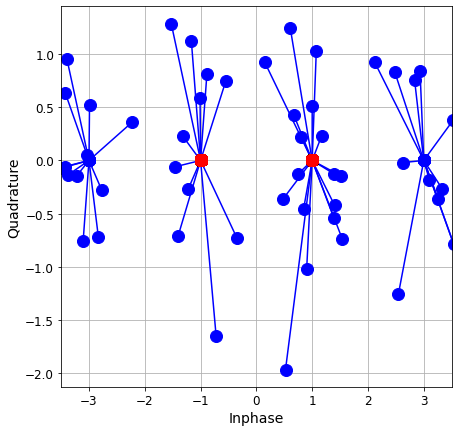

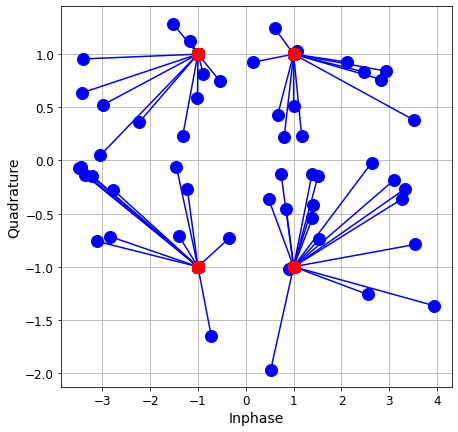

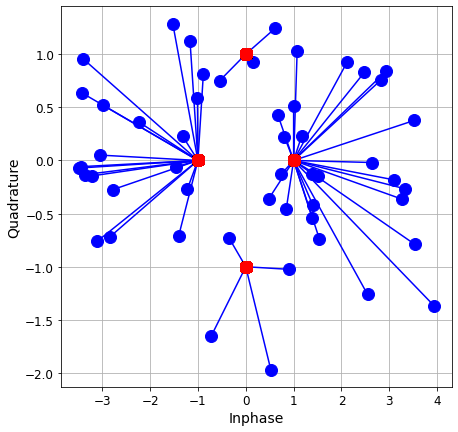

In [108]:
# Tx 4-ASK

# 4-ASK
# Plot nearest neighbor mapping process of received subcarrier symbols to closest possible symbol representation
plt.figure(figsize=(pwidth,pwidth))
for qam, hard in zip(QAM_est3, hardDecision8):
    plt.plot([qam.real, hard.real], [qam.imag, hard.imag], 'b-o', markersize=12);
    plt.plot(hardDecision2.real, hardDecision2.imag, 'ro', markersize=12)
plt.xlabel('Inphase')
plt.ylabel('Quadrature')
plt.grid()
plt.xlim([-3.5,3.5])
plt.savefig('evmofdm.eps', format='eps')
plt.show()

# 4-QAM
# Plot nearest neighbor mapping process of received subcarrier symbols to closest possible symbol representation
plt.figure(figsize=(pwidth,pwidth))
for qam, hard in zip(QAM_est3, hardDecision6):
    plt.plot([qam.real, hard.real], [qam.imag, hard.imag], 'b-o', markersize=12);
    plt.plot(hardDecision0.real, hardDecision0.imag, 'ro', markersize=12)
plt.xlabel('Inphase')
plt.ylabel('Quadrature')
plt.grid()
plt.savefig('evmofdm.eps', format='eps')
plt.show()

# pi/4 QPSK
# Plot nearest neighbor mapping process of received subcarrier symbols to closest possible symbol representation
plt.figure(figsize=(pwidth,pwidth))
for qam, hard in zip(QAM_est3, hardDecision7):
    plt.plot([qam.real, hard.real], [qam.imag, hard.imag], 'b-o', markersize=12);
    plt.plot(hardDecision1.real, hardDecision1.imag, 'ro', markersize=12)
plt.xlabel('Inphase')
plt.ylabel('Quadrature')
plt.grid()
plt.savefig('evmofdm.eps', format='eps')
plt.show()

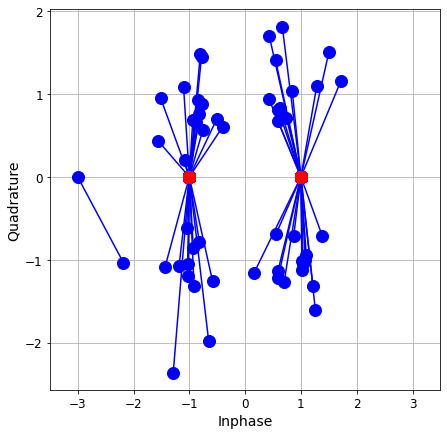

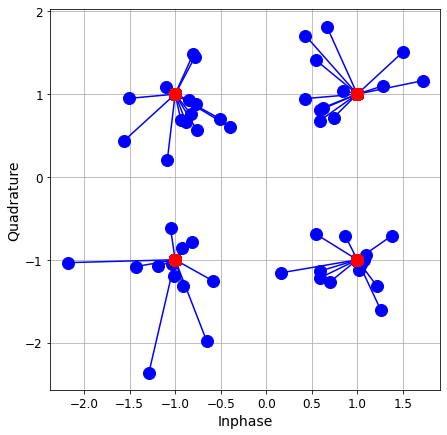

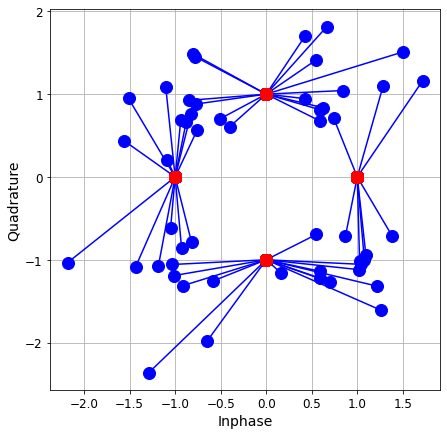

In [109]:
# 4-QAM Tx

# 4-ASK
# Plot nearest neighbor mapping process of received subcarrier symbols to closest possible symbol representation
plt.figure(figsize=(pwidth,pwidth))
for qam, hard in zip(QAM_est2, hardDecision5):
    plt.plot([qam.real, hard.real], [qam.imag, hard.imag], 'b-o', markersize=12);
    plt.plot(hardDecision2.real, hardDecision2.imag, 'ro', markersize=12)
plt.xlabel('Inphase')
plt.ylabel('Quadrature')
plt.grid()
plt.xlim([-3.5,3.5])
plt.savefig('evmofdm.eps', format='eps')
plt.show()

# 4-QAM
# Plot nearest neighbor mapping process of received subcarrier symbols to closest possible symbol representation
plt.figure(figsize=(pwidth,pwidth))
for qam, hard in zip(QAM_est2, hardDecision3):
    plt.plot([qam.real, hard.real], [qam.imag, hard.imag], 'b-o', markersize=12);
    plt.plot(hardDecision0.real, hardDecision0.imag, 'ro', markersize=12)
plt.xlabel('Inphase')
plt.ylabel('Quadrature')
plt.grid()
plt.savefig('evmofdm.eps', format='eps')
plt.show()

# pi/4 QPSK
# Plot nearest neighbor mapping process of received subcarrier symbols to closest possible symbol representation
plt.figure(figsize=(pwidth,pwidth))
for qam, hard in zip(QAM_est2, hardDecision4):
    plt.plot([qam.real, hard.real], [qam.imag, hard.imag], 'b-o', markersize=12);
    plt.plot(hardDecision1.real, hardDecision1.imag, 'ro', markersize=12)
plt.xlabel('Inphase')
plt.ylabel('Quadrature')
plt.grid()
plt.savefig('evmofdm.eps', format='eps')
plt.show()

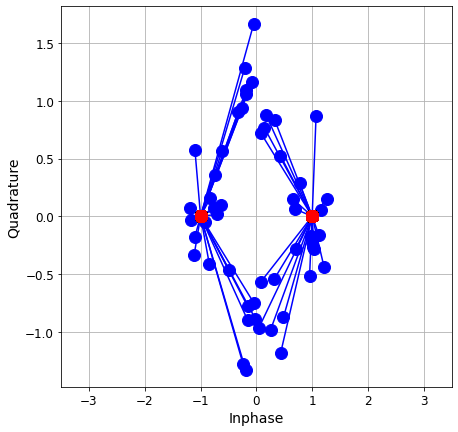

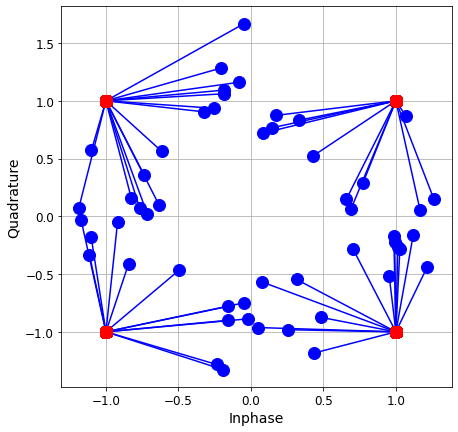

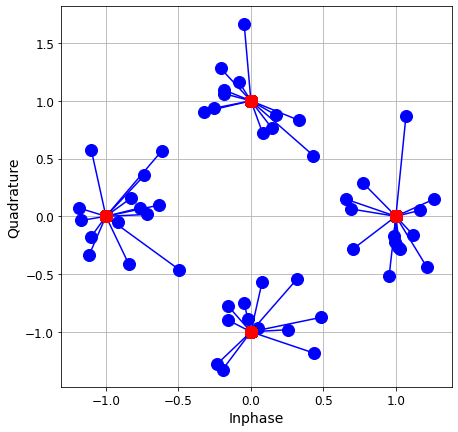

In [110]:
# pi/4 QPSK Tx

# 4-ASK
# Plot nearest neighbor mapping process of received subcarrier symbols to closest possible symbol representation
plt.figure(figsize=(pwidth,pwidth))
for qam, hard in zip(QAM_est, hardDecision2):
    plt.plot([qam.real, hard.real], [qam.imag, hard.imag], 'b-o', markersize=12);
    plt.plot(hardDecision2.real, hardDecision2.imag, 'ro', markersize=12)
plt.xlabel('Inphase')
plt.ylabel('Quadrature')
plt.grid()
plt.xlim([-3.5,3.5])
plt.savefig('evmofdm.eps', format='eps')
plt.show()

# 4-QAM
# Plot nearest neighbor mapping process of received subcarrier symbols to closest possible symbol representation
plt.figure(figsize=(pwidth,pwidth))
for qam, hard in zip(QAM_est, hardDecision0):
    plt.plot([qam.real, hard.real], [qam.imag, hard.imag], 'b-o', markersize=12);
    plt.plot(hardDecision0.real, hardDecision0.imag, 'ro', markersize=12)
plt.xlabel('Inphase')
plt.ylabel('Quadrature')
plt.grid()
plt.savefig('evmofdm.eps', format='eps')
plt.show()

# pi/4 QPSK
# Plot nearest neighbor mapping process of received subcarrier symbols to closest possible symbol representation
plt.figure(figsize=(pwidth,pwidth))
for qam, hard in zip(QAM_est, hardDecision1):
    plt.plot([qam.real, hard.real], [qam.imag, hard.imag], 'b-o', markersize=12);
    plt.plot(hardDecision1.real, hardDecision1.imag, 'ro', markersize=12)
plt.xlabel('Inphase')
plt.ylabel('Quadrature')
plt.grid()
plt.savefig('evmofdm.eps', format='eps')
plt.show()

### Question 7:
<br> For an OFDM implementation employing 4-QAM per subcarrier at the transmitter and sending L OFDM symbols (L > 1), use RMS EVM to map the received subcarrier symbols to the nearest 4-QAM signal constellation point. Repeat when employing π/4-offset QPSK modulation. Produce plots similar to Figure 5 in both cases. Indicate the RMS EVM values for each implementation.

RX Signal power: 0.0385. Noise power: 0.0061
RX Signal power: 0.0385. Noise power: 0.0061
RX Signal power: 0.0385. Noise power: 0.0061


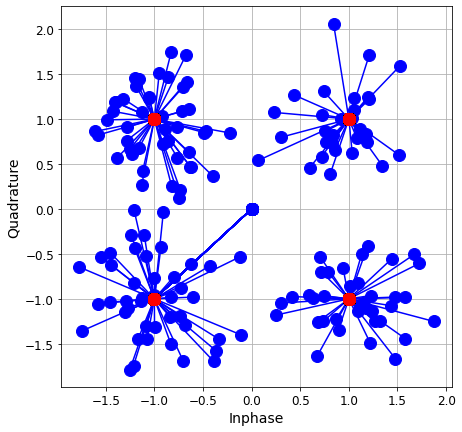

In [112]:
def L_OFDM_symbols_4QAM(L):

    # Define the specifications of the OFDM transceiver
    M = 2
    dataCarriers = 52 # Number of data subcarriers
    total_ofdm_symbols = dataCarriers*M  # Total number of bits transmitted per OFDM symbol

    QAM4_est = np.zeros(dataCarriers)
    for n in range(L):
        # Generate random bits that will form one OFDM symbol
        bits = np.random.binomial(n=1, p=0.5, size=(total_ofdm_symbols, ))

        # Reshape binary data such that M bits for each of the subcarriers 
        bits_SP = SP(bits)

        # Map bits to symbols (in this case, these are being mapped to QAM)
        def Mapping(bits):
            return np.array([mapping_table[tuple(b)] for b in bits])
        QAM = Mapping(bits_SP)

        # Generate one OFDM symbol using IDFT
        # Setup OFDM symbol by initializing with zero vector
        OFDM_data = OFDM_symbol(QAM)

        # Apply IDFT to create one OFDM symbol
        OFDM_time = IDFT(OFDM_data)

        # Pass transmitted OFDM symbol through channel and produce received OFDM symbol 
        OFDM_TX = OFDM_time
        OFDM_RX = channel(OFDM_TX)

        # Apply DFT to received OFDM symbol to recover symbols for each subcarrier
        OFDM_demod = DFT(OFDM_RX)

        # Extract subcarrier symbols that formed one OFDM symbol
        QAM4_est = np.append(QAM4_est,get_payload(OFDM_demod))

    return QAM4_est
       
var = L_OFDM_symbols_4QAM(3)

PS_est9, hardDecision9 = Demapping(var, demapping_table)      #4-QAM

# 4-QAM
# Plot nearest neighbor mapping process of received subcarrier symbols to closest possible symbol representation
plt.figure(figsize=(pwidth,pwidth))
for qam, hard in zip(var, hardDecision9):
    plt.plot([qam.real, hard.real], [qam.imag, hard.imag], 'b-o', markersize=12);
    plt.plot(hardDecision0.real, hardDecision0.imag, 'ro', markersize=12)
plt.xlabel('Inphase')
plt.ylabel('Quadrature')
plt.grid()
plt.savefig('evmofdm.eps', format='eps')
plt.show()

RX Signal power: 0.0192. Noise power: 0.0030
RX Signal power: 0.0192. Noise power: 0.0030
RX Signal power: 0.0192. Noise power: 0.0030


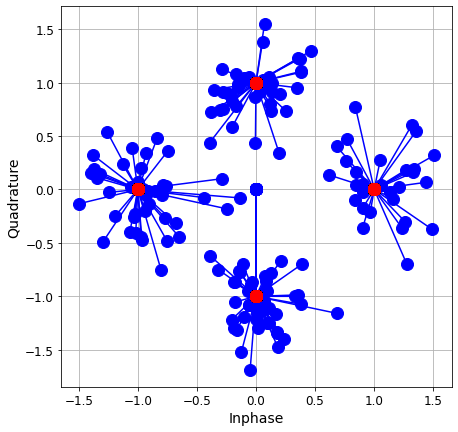

In [115]:
def L_OFDM_symbols_pi4QAM(L):

    # Define the specifications of the OFDM transceiver
    M = 2
    dataCarriers = 52 # Number of data subcarriers
    total_ofdm_symbols = dataCarriers*M  # Total number of bits transmitted per OFDM symbol

    QAM5_est = np.zeros(dataCarriers)
    for n in range(L):
        # Generate random bits that will form one OFDM symbol
        bits = np.random.binomial(n=1, p=0.5, size=(total_ofdm_symbols, ))

        # Reshape binary data such that M bits for each of the subcarriers 
        bits_SP = SP(bits)

        # Map bits to symbols (in this case, these are being mapped to QAM)
        def Mapping(bits):
            return np.array([mapping_table1[tuple(b)] for b in bits])
        QAM = Mapping(bits_SP)

        # Generate one OFDM symbol using IDFT
        # Setup OFDM symbol by initializing with zero vector
        OFDM_data = OFDM_symbol(QAM)

        # Apply IDFT to create one OFDM symbol
        OFDM_time = IDFT(OFDM_data)

        # Pass transmitted OFDM symbol through channel and produce received OFDM symbol 
        OFDM_TX = OFDM_time
        OFDM_RX = channel(OFDM_TX)

        # Apply DFT to received OFDM symbol to recover symbols for each subcarrier
        OFDM_demod = DFT(OFDM_RX)

        # Extract subcarrier symbols that formed one OFDM symbol
        QAM5_est = np.append(QAM5_est,get_payload(OFDM_demod))

        # PS_est10, hardDecision10 = Demapping(QAM5_est, demapping_table1)      #pi/4 QPSK
        # if (n == 0):
        #     for qam, hard in zip(QAM5_est, hardDecision10):
        #         qam1 = np.append(qam1,qam)
        #         hard1 = np.append(hard1, hard)
        #         plt.plot([qam.real, hard.real], [qam.imag, hard.imag], 'b-o', markersize=12);
        #         plt.plot(hardDecision10.real, hardDecision10.imag, 'ro', markersize=12)
        # elif (n == 1):
        #     for qam, hard in zip(QAM5_est, hardDecision10):
        #         plt.plot([qam.real, hard.real], [qam.imag, hard.imag], 'g-o', markersize=12);
        # elif (n == 2):
        #     for qam, hard in zip(QAM5_est, hardDecision10):
        #         plt.plot([qam.real, hard.real], [qam.imag, hard.imag], 'y-o', markersize=12);
        # elif (n == 3):
        #     for qam, hard in zip(QAM5_est, hardDecision10):
        #         plt.plot([qam.real, hard.real], [qam.imag, hard.imag], 'm-o', markersize=12);

    return QAM5_est
       
var = L_OFDM_symbols_pi4QAM(3)

PS_est10, hardDecision10 = Demapping(var, demapping_table1)      #pi/4 QPSK

# 4-QAM
# Plot nearest neighbor mapping process of received subcarrier symbols to closest possible symbol representation
plt.figure(figsize=(pwidth,pwidth))
for qam, hard in zip(var, hardDecision10):
    plt.plot([qam.real, hard.real], [qam.imag, hard.imag], 'b-o', markersize=12);
    plt.plot(hardDecision10.real, hardDecision10.imag, 'ro', markersize=12)
plt.xlabel('Inphase')
plt.ylabel('Quadrature')
plt.grid()
# plt.savefig('evmofdm.eps', format='eps')
plt.show()

### Question 8:
<br> Find the value of SNR for the OFDM transceiver that would yield a Bit Error Rate (BER) approximately (±10%) equal to 0.01, 0.001, and 0.0001. Provide the associated RMS EVM values for these SNRs. HINT: Transmit enough bits such that 100 errors are obtained in order to achieve a BER with 95% confidence.

In [124]:

# Transmit one OFDM symbol across noisy channel
def channel_mod(signal, SNR):
    signal_power = np.mean(abs(signal**2))
    sigma2 = signal_power * 10**(-SNR/10)  # calculate noise power based on signal power and SNR
    
    # Print out received signal power and noise power
    print ("RX Signal power: %.4f. Noise power: %.4f" % (signal_power, sigma2))
    
    # Generate complex noise with given variance
    noise = np.sqrt(sigma2/2) * (np.random.randn(*signal.shape)+1j*np.random.randn(*signal.shape))
    return signal + noise


SNR_q8 = 8
bits_SP_q8 = SP(bits)
QAM_q8 = Mapping(bits_SP_q8)

OFDM_data_q8 = OFDM_symbol(QAM_q8)
OFDM_time_q8 = IDFT(OFDM_data_q8)
OFDM_TX_q8 = OFDM_time_q8
OFDM_RX_q8 = channel_mod(OFDM_TX_q8, SNR_q8)
OFDM_demod_q8 = DFT(OFDM_RX_q8)
QAM_est_q8 = get_payload(OFDM_demod_q8)
PS_est_q8, hardDecision_q8 = Demapping(QAM_est_q8, demapping_table)      #4-QAM

RX Signal power: 0.0902. Noise power: 0.0000


In [125]:
# Generate estimate of original high-speed data stream and calculate bit error rate
def PS(bits):
    return bits.reshape((-1,))

bits_est = PS(PS_est_q8)
print ("Obtained Bit error rate for 4-QAM: ", np.sum(abs(bits-bits_est))/len(bits))

Obtained Bit error rate for 4-QAM:  0.41346153846153844
